<a href="https://colab.research.google.com/github/ArtemioPadilla/MachineLearningAndCOVID/blob/main/src/Forecast/LSTM_covid.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
cases_confirm_URL = 'https://raw.githubusercontent.com/DataHerb/dataset-covid-19/master/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv'

In [1]:
!pip install pmdarima

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
# Packeterias
import numpy as np
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import torch
import pickle
import torch.nn as nn
from torch.autograd import Variable
from sklearn.preprocessing import MinMaxScaler
import plotly.graph_objects as go
from tqdm import tqdm
import country_list
import numpy as np
from datetime import datetime
from datetime import timedelta
import matplotlib.pyplot as plt
import pmdarima as pm

In [3]:
cases_who = pd.read_csv('https://raw.githubusercontent.com/ArtemioPadilla/MachineLearningAndCOVID/main/Datasets/SDG-3-Health/WHO-COVID-19-global-data-up.csv')

In [ ]:
cases_who

,Date_reported,Country_code,Country,WHO_region,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths
0,2020-01-03,AF,Afghanistan,EMRO,0,0,0,0
1,2020-01-04,AF,Afghanistan,EMRO,0,0,0,0
2,2020-01-05,AF,Afghanistan,EMRO,0,0,0,0
3,2020-01-06,AF,Afghanistan,EMRO,0,0,0,0
4,2020-01-07,AF,Afghanistan,EMRO,0,0,0,0
...,...,...,...,...,...,...,...,...
210214,2022-06-03,ZW,Zimbabwe,AFRO,177,253051,1,5508
210215,2022-06-04,ZW,Zimbabwe,AFRO,185,253236,1,5509
210216,2022-06-05,ZW,Zimbabwe,AFRO,102,253338,1,5510
210217,2022-06-06,ZW,Zimbabwe,AFRO,59,253397,2,5512


In [4]:
aux =  cases_who[cases_who.New_cases !=0]. groupby('Country').sum()
aux

,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths
Country,,,,
Afghanistan,180741,73700698,7706,3205538
Albania,276415,96179775,3492,1495161
Algeria,265897,105447476,6867,2927418
American Samoa,6192,233003,31,841
Andorra,43067,5989544,147,49761
...,...,...,...,...
Wallis and Futuna,454,14142,5,97
Yemen,11822,3396067,2102,682416
Zambia,322207,91469454,3986,1367327


In [ ]:
list(aux[aux.New_cases>10000].index)

['Afghanistan',
 'Albania',
 'Algeria',
 'Andorra',
 'Angola',
 'Argentina',
 'Armenia',
 'Aruba',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Bahamas',
 'Bahrain',
 'Bangladesh',
 'Barbados',
 'Belarus',
 'Belgium',
 'Belize',
 'Benin',
 'Bermuda',
 'Bhutan',
 'Bolivia (Plurinational State of)',
 'Bosnia and Herzegovina',
 'Botswana',
 'Brazil',
 'Brunei Darussalam',
 'Bulgaria',
 'Burkina Faso',
 'Burundi',
 'Cabo Verde',
 'Cambodia',
 'Cameroon',
 'Canada',
 'Cayman Islands',
 'Central African Republic',
 'Chile',
 'China',
 'Colombia',
 'Congo',
 'Costa Rica',
 'Croatia',
 'Cuba',
 'Curaçao',
 'Cyprus',
 'Czechia',
 'Côte d’Ivoire',
 'Democratic Republic of the Congo',
 'Denmark',
 'Djibouti',
 'Dominica',
 'Dominican Republic',
 'Ecuador',
 'Egypt',
 'El Salvador',
 'Equatorial Guinea',
 'Estonia',
 'Eswatini',
 'Ethiopia',
 'Faroe Islands',
 'Fiji',
 'Finland',
 'France',
 'French Guiana',
 'French Polynesia',
 'Gabon',
 'Gambia',
 'Georgia',
 'Germany',
 'Ghana',
 'Gibraltar',
 '

In [ ]:
aux[aux.New_cases>10000].index

Index(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola', 'Argentina',
       'Armenia', 'Aruba', 'Australia', 'Austria',
       ...
       'United States of America', 'Uruguay', 'Uzbekistan', 'Vanuatu',
       'Venezuela (Bolivarian Republic of)', 'Viet Nam', 'Yemen', 'Zambia',
       'Zimbabwe', 'occupied Palestinian territory, including east Jerusalem'],
      dtype='object', name='Country', length=199)

In [ ]:
fig = px.scatter(cases_who, x="Date_reported", y="New_cases", color="Country")
fig.show()

In [ ]:
fig = px.line(cases_who, x="Date_reported", y="New_cases", color="Country", line_group="Country")
fig.show()

In [ ]:
fig = px.line(cases_who, x="Date_reported", y="New_deaths", color="Country", line_group="Country")
fig.show()

In [ ]:
cases_who.Country.value_counts().index

Index(['Afghanistan', 'Paraguay', 'Nigeria', 'Niue', 'North Macedonia',
       'Northern Mariana Islands (Commonwealth of the)', 'Norway',
       'occupied Palestinian territory, including east Jerusalem', 'Oman',
       'Other',
       ...
       'Germany', 'Ghana', 'Gibraltar', 'Greece', 'Greenland', 'Grenada',
       'Guadeloupe', 'Guam', 'Guatemala', 'Zimbabwe'],
      dtype='object', length=237)

#Red LSTM

In [ ]:
countries2 = list(aux[aux.New_deaths>10000].index) 
countries = list(aux[aux.New_cases>10000].index)

In [ ]:
training_set_af =cases_who[cases_who.Country == "Afghanistan"][cases_who.New_cases !=0 ]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [ ]:
cases_who[cases_who.Country == "Afghanistan"][cases_who.New_cases !=0 ]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



,Date_reported,Country_code,Country,WHO_region,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths
52,2020-02-24,AF,Afghanistan,EMRO,5,5,0,0
64,2020-03-07,AF,Afghanistan,EMRO,3,8,0,0
68,2020-03-11,AF,Afghanistan,EMRO,3,11,0,0
71,2020-03-14,AF,Afghanistan,EMRO,3,14,0,0
72,2020-03-15,AF,Afghanistan,EMRO,6,20,0,0
...,...,...,...,...,...,...,...,...
882,2022-06-03,AF,Afghanistan,EMRO,101,180520,1,7708
883,2022-06-04,AF,Afghanistan,EMRO,64,180584,0,7708
884,2022-06-05,AF,Afghanistan,EMRO,34,180618,1,7709
885,2022-06-06,AF,Afghanistan,EMRO,70,180688,0,7709


##Arquitectura

In [5]:
def sliding_windows(data, seq_length):
    x = []
    y = []

    for i in range(len(data)-seq_length-1):
        _x = data[i:(i+seq_length)]
        _y = data[i+seq_length]
        x.append(_x)
        y.append(_y)

    return np.array(x),np.array(y)


In [6]:
class LSTM(nn.Module):

    def __init__(self, seq_length, num_classes, input_size, hidden_size, num_layers):
        super(LSTM, self).__init__()
        
        self.num_classes = num_classes
        self.num_layers = num_layers
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.seq_length = seq_length
        
        self.lstm = nn.LSTM(input_size=input_size, hidden_size=hidden_size,
                            num_layers=num_layers, batch_first=True)
        
        self.fc = nn.Linear(hidden_size, num_classes)

    def forward(self, x):
        h_0 = Variable(torch.zeros(
            self.num_layers, x.size(0), self.hidden_size))
        
        c_0 = Variable(torch.zeros(
            self.num_layers, x.size(0), self.hidden_size))
        
        # Propagate input through LSTM
        ula, (h_out, _) = self.lstm(x, (h_0, c_0))
        
        h_out = h_out.view(-1, self.hidden_size)
        
        out = self.fc(h_out)
        
        return out

In [ ]:
##

##Entrenamiento

###LSTM

In [7]:
def train_lstm(trainX,trainY, seq_length=4, num_epochs = 2000,learning_rate = 0.01,input_size = 1,hidden_size = 4,num_layers = 1,num_classes = 1):
  lstm = LSTM(seq_length, num_classes, input_size, hidden_size, num_layers)

  criterion = torch.nn.MSELoss()    # mean-squared error for regression
  optimizer = torch.optim.Adam(lstm.parameters(), lr=learning_rate)
  #optimizer = torch.optim.SGD(lstm.,(), lr=learning_rate)

  # Train the model
  for epoch in tqdm(range(num_epochs)):
      outputs = lstm(trainX)
      optimizer.zero_grad()
      
      # obtain the loss function
      loss = criterion(outputs, trainY)
      
      loss.backward()
      
      optimizer.step()
      #if epoch % 100 == 0:
        #print("Epoch: %d, loss: %1.5f" % (epoch, loss.item()))
  return lstm
#lstm = tain_lstm(trainX,trainY)

In [8]:
def data_train(country, window, time,type_ts ):
  #Filtramos datos
  training_set =cases_who[cases_who.Country ==country][cases_who[type_ts] !=0 ]
  sc = MinMaxScaler()
  training_data = sc.fit_transform(training_set[type_ts].values.reshape(-1, 1))
  
  num_layers = 1
  seq_length = window
  x, y = sliding_windows(training_data, seq_length)
  train_size = int(len(y) * 0.80)
  test_size = len(y) - train_size

  #Conjuntos de entrenamiento y prueba
  dataX = Variable(torch.Tensor(np.array(x)))
  dataY = Variable(torch.Tensor(np.array(y)))

  trainX = Variable(torch.Tensor(np.array(x[0:train_size])))
  trainY = Variable(torch.Tensor(np.array(y[0:train_size])))

  testX = Variable(torch.Tensor(np.array(x[train_size:len(x)])))
  testY = Variable(torch.Tensor(np.array(y[train_size:len(y)])))
  return trainX, trainY

sc = MinMaxScaler()
trainX,trainY= data_train("Afghanistan", 4, 30, "New_cases")
#Entrenamos
lstm = train_lstm(trainX,trainY)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
100%|██████████| 2000/2000 [00:16<00:00, 124.74it/s]


In [9]:
countries = list(aux[aux.New_cases>10000].index)
for country in countries:
  trainX,trainY= data_train(country, 4, 30, "New_cases")
  #Entrenamos
  lstm = train_lstm(trainX,trainY)
  torch.save(lstm.state_dict(), '/content/drive/MyDrive/Ciencia de datos/8 Octavo/DeepLearning/Proyecto/LSTMS_models/'+country+'_New_cases.pth')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
100%|██████████| 2000/2000 [00:08<00:00, 248.27it/s]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
100%|██████████| 2000/2000 [00:05<00:00, 353.19it/s]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
100%|██████████| 2000/2000 [00:05<00:00, 350.31it/s]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':
100%|██████████| 2000/2000 [00:04<00:00, 419.03it/s]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match Data

In [21]:

for country in countries2:
  trainX,trainY= data_train(country, 4, 30, "New_deaths")
  #Entrenamos
  lstm = train_lstm(trainX,trainY)
  torch.save(lstm.state_dict(), '/content/drive/MyDrive/Ciencia de datos/8 Octavo/DeepLearning/Proyecto/LSTMS_models_deaths/'+country+'New_deaths.pth')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

100%|██████████| 2000/2000 [00:05<00:00, 367.37it/s]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

100%|██████████| 2000/2000 [00:05<00:00, 348.29it/s]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

100%|██████████| 2000/2000 [00:05<00:00, 363.19it/s]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

100%|██████████| 2000/2000 [00:03<00:00, 578.66it/s]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

100%|██████████| 2000/2000 [00:04<00:00, 423.55it/s]
/usr/local/lib/pytho

RuntimeError: ignored

In [30]:
for pais in list(aux[aux.New_deaths>10000].index) :
  if pais not in countries:
    print(pais)

In [33]:
'''for country in ['Tunisia',
 'Turkey',
 'Ukraine',
 'United States of America',
 'Viet Nam']:

  trainX,trainY= data_train(country, 4, 30, "New_deaths")
  #Entrenamos
  lstm = train_lstm(trainX,trainY)
  torch.save(lstm.state_dict(), '/content/drive/MyDrive/Ciencia de datos/8 Octavo/DeepLearning/Proyecto/LSTMS_models_deaths/'+country+'New_deaths.pth')'''

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

100%|██████████| 2000/2000 [00:06<00:00, 331.73it/s]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

100%|██████████| 2000/2000 [00:06<00:00, 317.62it/s]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

100%|██████████| 2000/2000 [00:07<00:00, 250.81it/s]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

100%|██████████| 2000/2000 [00:07<00:00, 254.47it/s]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

100%|██████████| 2000/2000 [00:06<00:00, 320.15it/s]


### ARIMA

In [38]:
def arima_train(country,type_ts):
  training_set =cases_who[cases_who.Country ==country][cases_who[type_ts] !=0 ]
  model_arima = pm.auto_arima(training_set[type_ts], start_p=0, start_q=0,
                    test='kpss',
                    max_p=3, max_q=3,
                    m=1,
                    d=None,
                    trace=False,
                    error_action='ignore',
                    suppress_warnings=True,
                    stepwise=True)
  
  return model_arima

In [45]:
for country in countries:
  model = arima_train(country,"New_cases")
  with open('/content/drive/MyDrive/Ciencia de datos/8 Octavo/DeepLearning/Proyecto/ARIMA_models_New_cases/'+country+'New_cases.pkl', 'wb') as pkl:
    pickle.dump(model, pkl)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/usr/l

In [43]:
for country in countries2:
  model = arima_train(country,"New_deaths")
  with open('/content/drive/MyDrive/Ciencia de datos/8 Octavo/DeepLearning/Proyecto/ARIMA_models_New_deaths/'+country+'New_deaths.pkl', 'wb') as pkl:
    pickle.dump(model, pkl)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/usr/l

##Predicciones

In [ ]:
def predict_future_jojojo(data_last,time_future, window):
  predictions = data_last
  lstm.eval()
  for _ in range(time_future):
    train_predict = lstm(Variable(torch.Tensor(np.array([predictions[-window:]]).reshape(-1,window,1)))).data.numpy()
    predictions.append(train_predict[0][0])
  data_predict = sc.inverse_transform(np.array(predictions).reshape(-1,1))
  return data_predict
  
def plot_ts(model,time, window, country,type_ts ):
  #Filtramos datos
  training_set =cases_who[cases_who.Country ==country][cases_who[type_ts] !=0 ]
  #sc = MinMaxScaler()
  training_data = sc.fit_transform(training_set[type_ts].values.reshape(-1, 1))
  
  num_layers = 1
  seq_length = window
  x, y = sliding_windows(training_data, seq_length)
  train_size = int(len(y) * 0.80)
  test_size = len(y) - train_size

  #Conjuntos de entrenamiento y prueba
  dataX = Variable(torch.Tensor(np.array(x)))
  dataY = Variable(torch.Tensor(np.array(y)))

  trainX = Variable(torch.Tensor(np.array(x[0:train_size])))
  trainY = Variable(torch.Tensor(np.array(y[0:train_size])))

  testX = Variable(torch.Tensor(np.array(x[train_size:len(x)])))
  testY = Variable(torch.Tensor(np.array(y[train_size:len(y)])))

  #Entrenamos
  #lstm = tain_lstm(trainX,trainY)
  model.eval()

  train_predict = model(dataX)

  data_predict = train_predict.data.numpy()
  dataY_plot = dataY.data.numpy()

  #pred_future = predict_future_jojojo(data_predict[-window:].reshape(1,window)[0].tolist(),time, window)  
  pred_future = predict_future_jojojo(training_data[-window:].reshape(1,window)[0].tolist(),time, window)  

  data_predict = sc.inverse_transform(data_predict)
  dataY_plot = sc.inverse_transform(dataY_plot)

  date_pred = pd.date_range(training_set.Date_reported[-2:].values[0], periods=time)
  
  
  dates_final = np.hstack([training_set.Date_reported, date_pred])
  
  predicts_final = np.vstack([training_set[type_ts][-1:], pred_future])

  
  model_arima = pm.auto_arima(training_set[type_ts], start_p=0, start_q=0,
                    test='kpss',
                    max_p=3, max_q=3,
                    m=1,
                    d=None,
                    trace=False,
                    error_action='ignore',
                    suppress_warnings=True,
                    stepwise=True)
  
  fc = model_arima.predict(n_periods=time, return_conf_int=False)
  
  fig = go.Figure()

  # Add traces
  fig.add_trace(go.Scatter(x = training_set.Date_reported, y=training_set[type_ts],
                      mode='lines',
                      name='Observaciones reales'))
  #fig.add_vline(x=training_set.Date_reported[train_size], line_width=3, line_dash="dash", line_color="green")
  #fig.add_trace(go.Scatter(x=date_pred.astype('str'), y=pred_future.reshape(1, len(pred_future))[0],
  #                    mode='lines+markers',
  #                    name='Predicciones con LSTM'))
  fig.add_trace(go.Scatter(x=date_pred.astype('str')[1:], y=pred_future.reshape(1, len(pred_future))[0],
                      mode='lines+markers',
                      name='Predicciones con LSTM'))
  fig.add_trace(go.Scatter(x=date_pred.astype('str')[1:], y=fc,
                      mode='lines+markers',
                      name='Predicciones con ARIMA'))
  
  type_ts_title = type_ts.replace("_", " ")
  fig.update_layout(title= type_ts_title + ' confirmed in ' + country,
                  yaxis_zeroline=False, xaxis_zeroline=False)

  fig.show()

In [52]:
def predict_future_jojojo(model,data_last,time_future, window):
  predictions = data_last
  model.eval()
  for _ in range(time_future):
    train_predict = model(Variable(torch.Tensor(np.array([predictions[-window:]]).reshape(-1,window,1)))).data.numpy()
    predictions.append(train_predict[0][0])
  data_predict = sc.inverse_transform(np.array(predictions).reshape(-1,1))
  return data_predict

## Funcion modificada a leer los modelos preentrenados
def plot_ts(model,arima_path, time, window, country,type_ts ):
  #Filtramos datos
  training_set =cases_who[cases_who.Country ==country][cases_who[type_ts] !=0 ]
  #sc = MinMaxScaler()
  training_data = sc.fit_transform(training_set[type_ts].values.reshape(-1, 1))
  
  #Entrenamos
  #model = tain_model(trainX,trainY)
  model.eval()

  #pred_future = predict_future_jojojo(data_predict[-window:].reshape(1,window)[0].tolist(),time, window)  
  pred_future = predict_future_jojojo(model,training_data[-window:].reshape(1,window)[0].tolist(),time, window)  

  date_pred = pd.date_range(training_set.Date_reported[-2:].values[0], periods=time)

  with open(arima_path, 'rb') as pkl:
    fc = pickle.load(pkl).predict(n_periods=time, return_conf_int=False)

  fig = go.Figure()

  # Add traces
  fig.add_trace(go.Scatter(x = training_set.Date_reported, y=training_set[type_ts],
                      mode='lines',
                      name='Observaciones reales'))
  fig.add_trace(go.Scatter(x=date_pred.astype('str')[1:], y=pred_future.reshape(1, len(pred_future))[0],
                      mode='lines+markers',
                      name='Predicciones con LSTM'))
  fig.add_trace(go.Scatter(x=date_pred.astype('str')[1:], y=fc,
                      mode='lines+markers',
                      name='Predicciones con ARIMA'))
  
  type_ts_title = type_ts.replace("_", " ")
  fig.update_layout(title= type_ts_title + ' confirmed in ' + country,
                  yaxis_zeroline=False, xaxis_zeroline=False)

  return fig

## Ejemplo

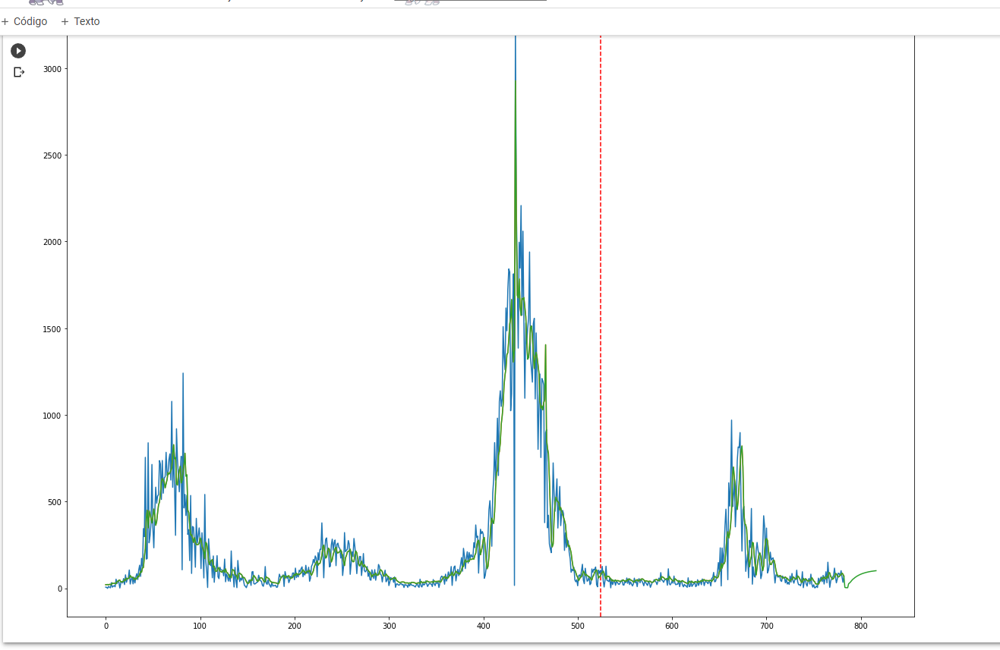

In [ ]:
# Como guardar y leer el modelo
#torch.save(lstm.state_dict(), 'checkpoint.pth') #guardamos
#lstm_save = torch.load('checkpoint.pth', map_location=torch.device("cpu")) #leemos
#model = LSTM(seq_length=4,input_size = 1,hidden_size = 2,num_layers = 1,num_classes = 1) #usamos
#model.load_state_dict(lstm_save)
#model.eval()

In [55]:
lstm_save = torch.load('/content/drive/MyDrive/Ciencia de datos/8 Octavo/DeepLearning/Proyecto/LSTMS_models/Russian Federation_New_cases.pth', map_location=torch.device("cpu"))
model_lstm = LSTM(seq_length=4,input_size = 1,hidden_size = 4,num_layers = 1,num_classes = 1)
model_lstm.load_state_dict(lstm_save)
model_lstm.eval()

LSTM(
  (lstm): LSTM(1, 4, batch_first=True)
  (fc): Linear(in_features=4, out_features=1, bias=True)
)

In [57]:
arima_path = '/content/drive/MyDrive/Ciencia de datos/8 Octavo/DeepLearning/Proyecto/ARIMA_models_New_cases/Russian FederationNew_cases.pkl'
plot_ts(model_lstm, arima_path,15, 4, "Russian Federation","New_cases"  )

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

